In [1]:
import cv2 as cv
# %matplotlib notebook
import matplotlib.pyplot as plt


import numpy as np
import glob
import ImageUtils as imu

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# img = cv.imread('./data/nemo.jpg')
img = imu.load_image('./data/nemo.jpg')
img2 = imu.load_image('./data/lena.png')

# Colorspaces

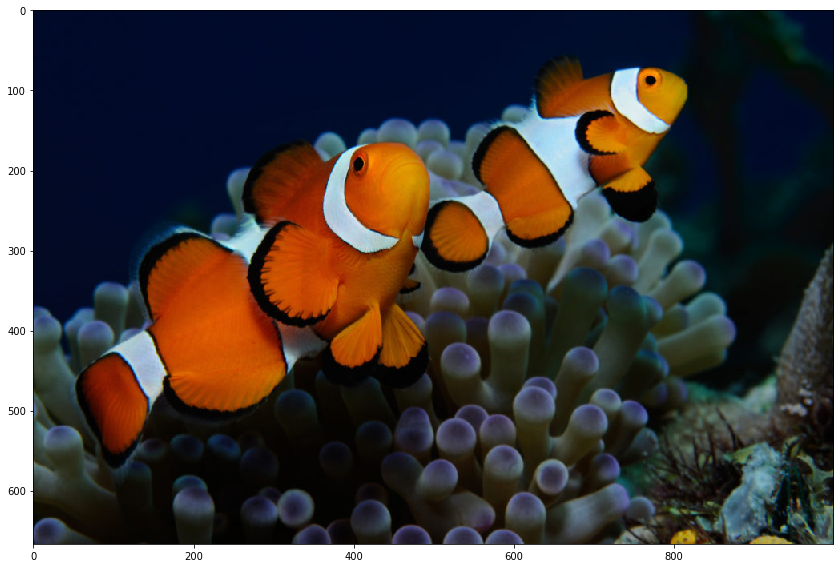

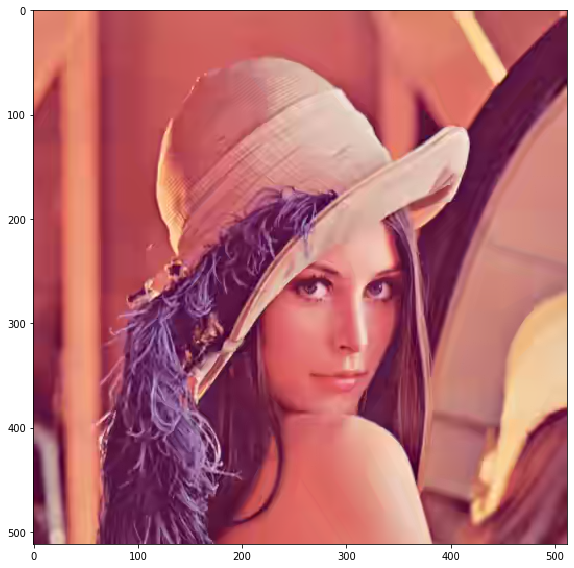

In [4]:
imu.show(img)
imu.show(img2)

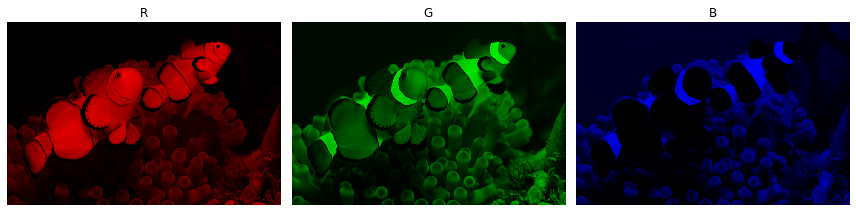

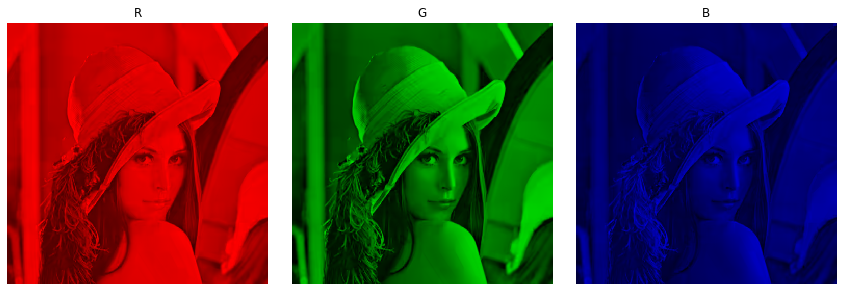

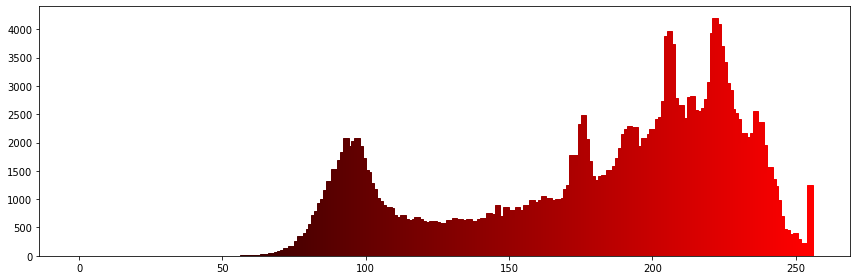

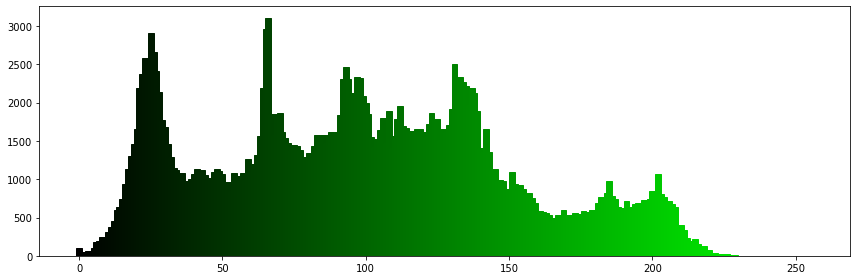

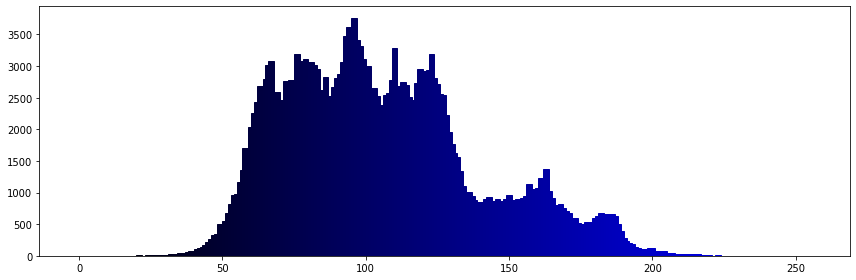

In [5]:
imu.show_rgb(img)
imu.show_rgb(img2)
imu.show_rgb_hist(img2)

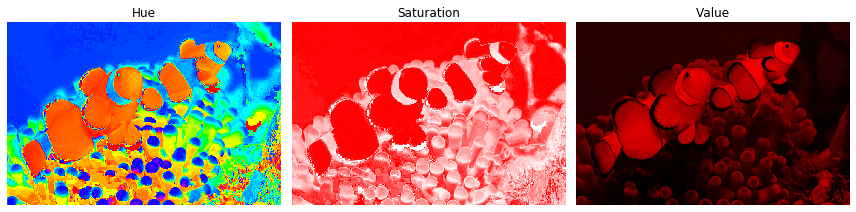

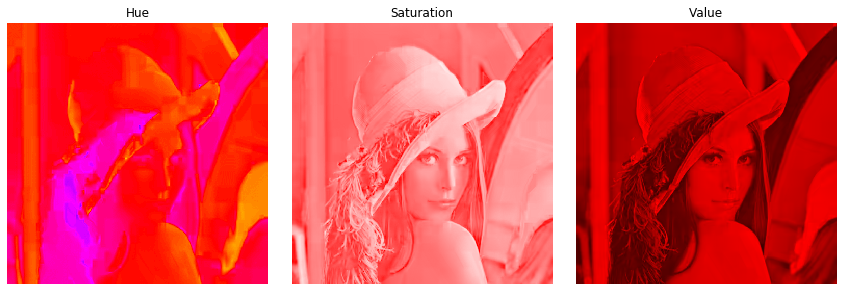

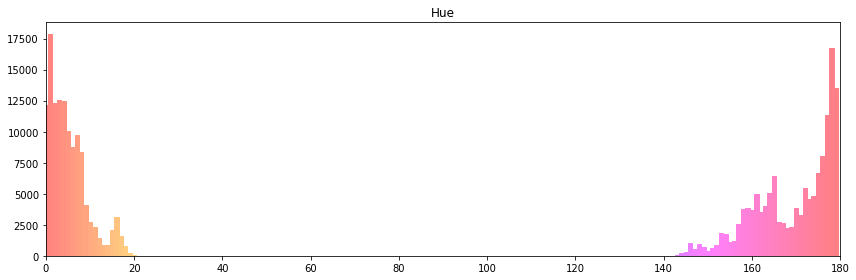

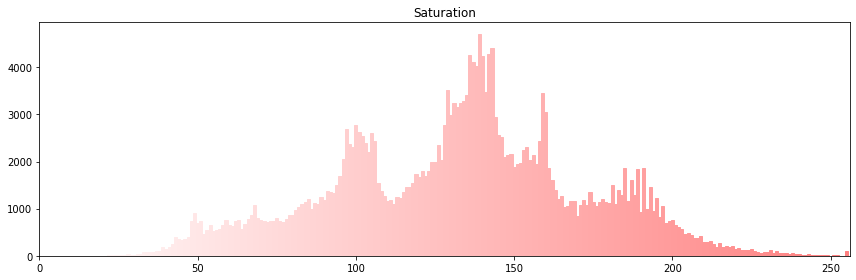

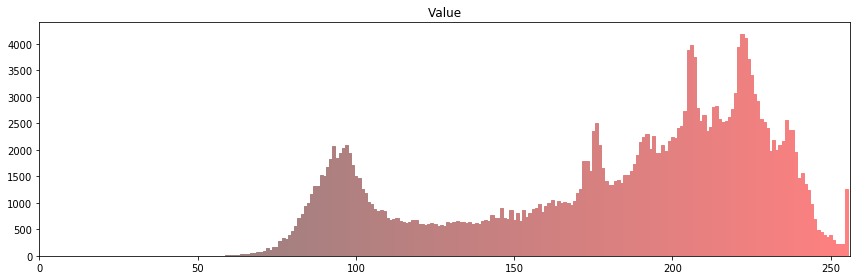

In [6]:
imu.show_hsv(img)
imu.show_hsv(img2)
imu.show_hsv_hist(img2)

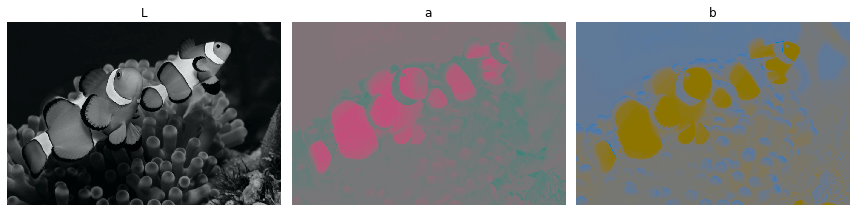

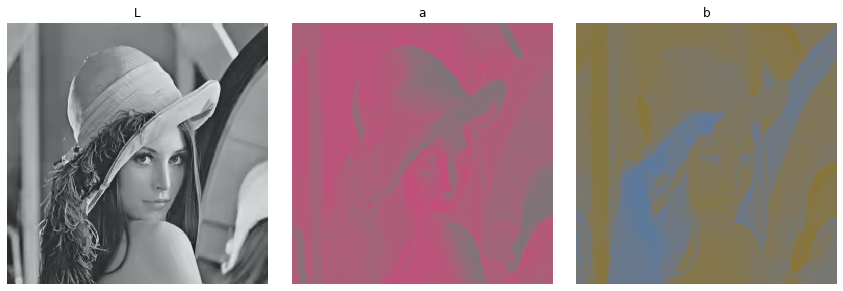

In [7]:
imu.show_lab(img)
imu.show_lab(img2)

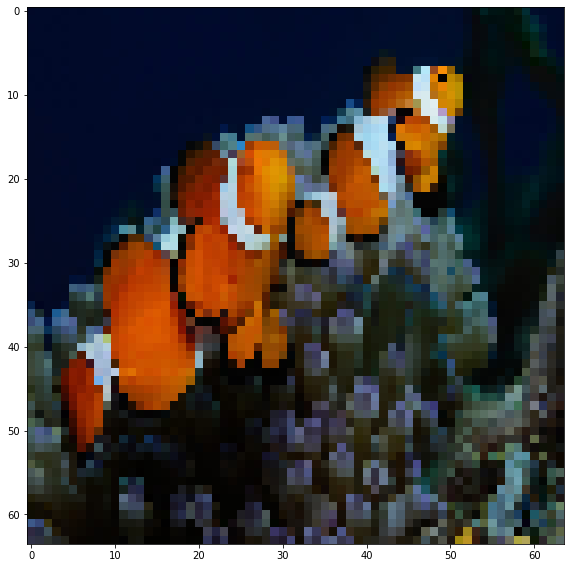

In [8]:
# img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img = cv.resize(img, (64,64))
imu.show(img)

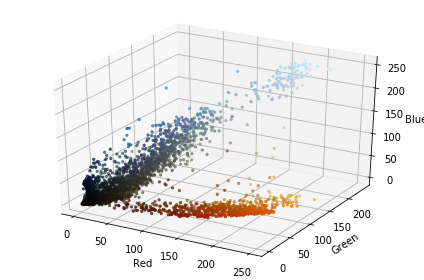

In [9]:
imu.plot_3dRGB(img)

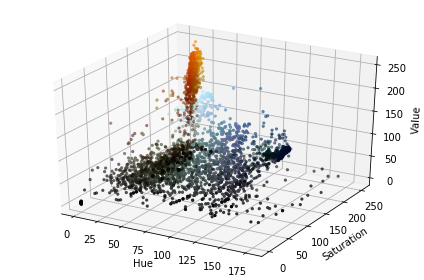

In [10]:
imu.plot_3dHSV(img)

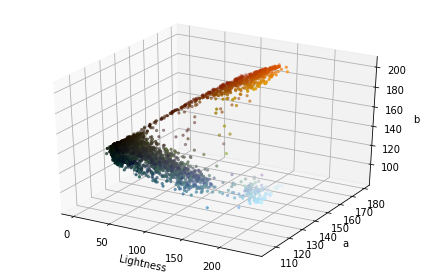

In [11]:
imu.plot_3dLAB(img)

# Filtering

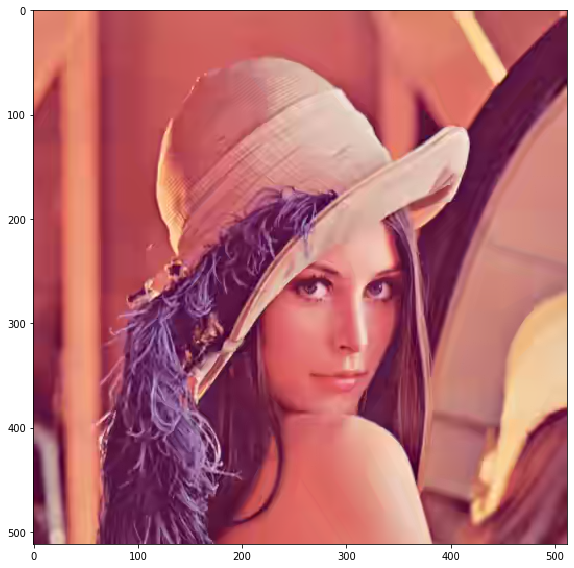

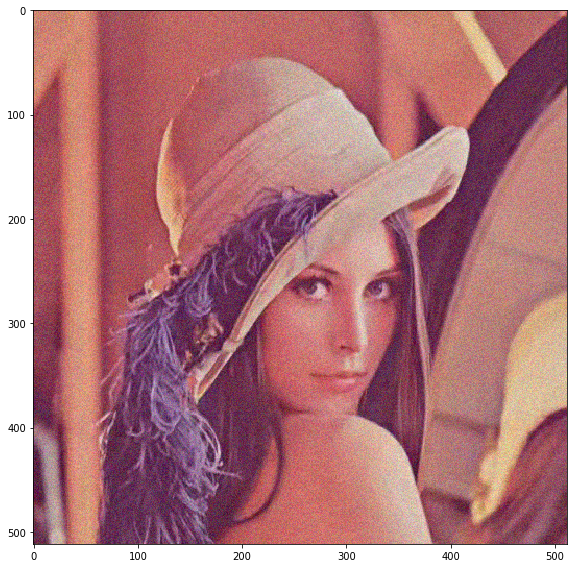

In [12]:
img = imu.load_image('./data/lena.png')
imu.show(img)
# adding noise
image = img.astype(np.float32) / 255
noised = (0.8*image + 0.2 *
np.random.rand(*image.shape).astype(np.float32))
noised = noised.clip(0, 1)
imu.show(noised)

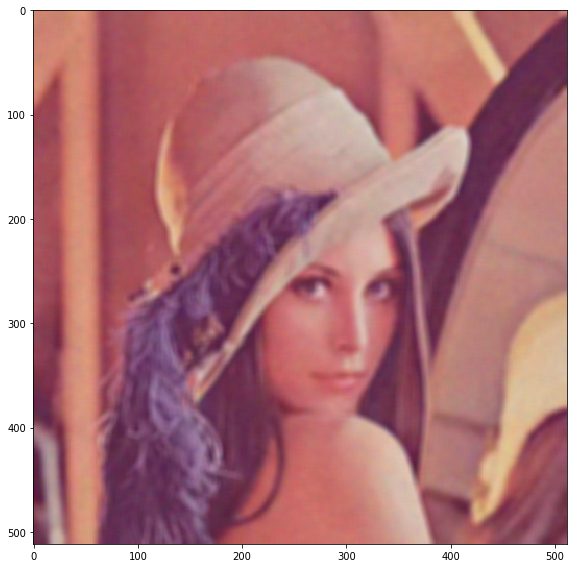

In [13]:
blur = cv.blur(noised, (7,7))
imu.show(blur)

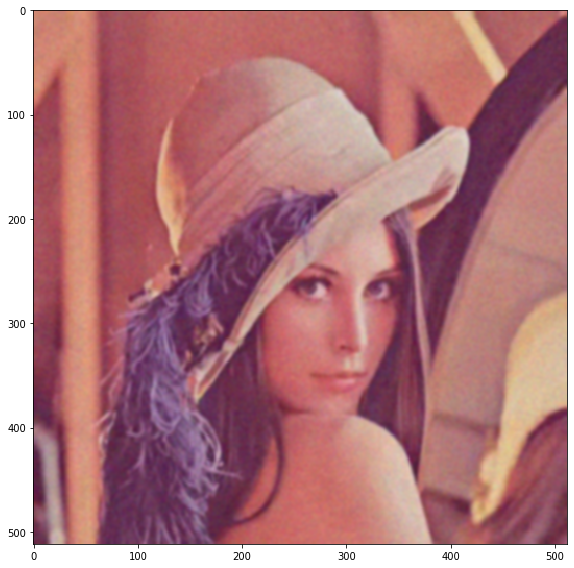

In [14]:
gauss_blur = cv.GaussianBlur(noised, (7, 7), 0)
imu.show(gauss_blur)

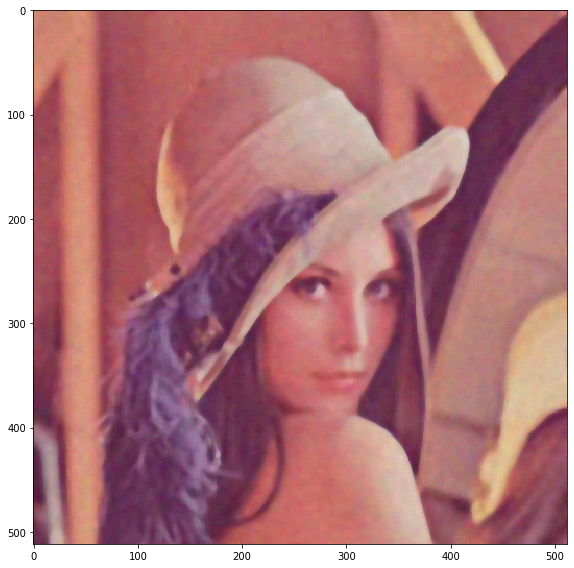

In [15]:
median_blur = cv.medianBlur((noised * 255).astype(np.uint8), 7)
imu.show(median_blur)

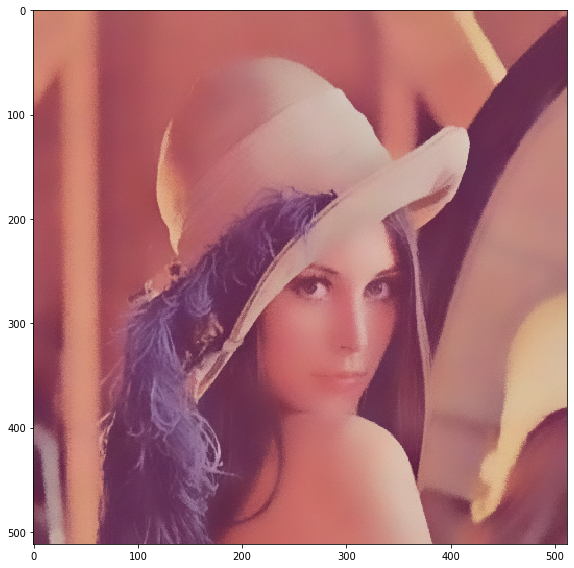

In [16]:
bilat = cv.bilateralFilter(noised, -1, 0.3, 10)
imu.show(bilat)

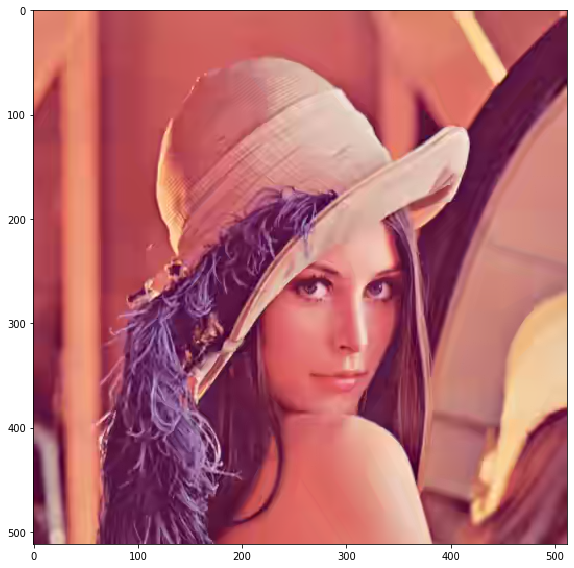

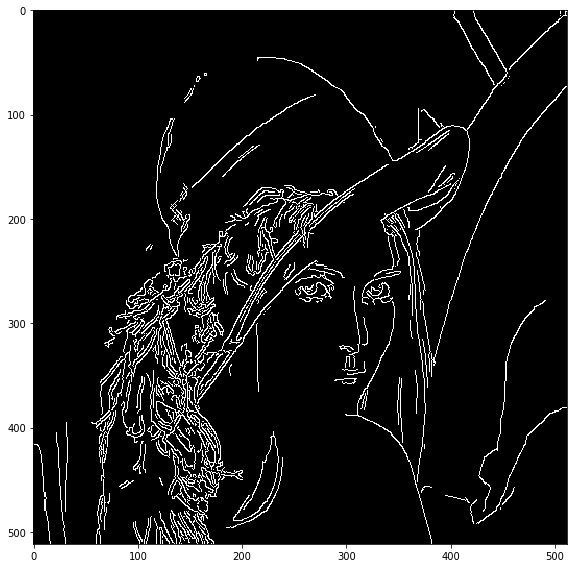

In [17]:
imu.show(img)
edges = cv.Canny(img, 100, 200)
imu.show(edges)

# Thresholding

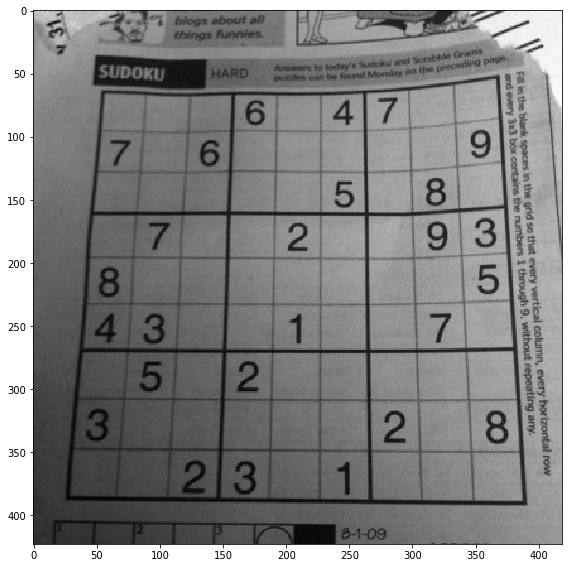

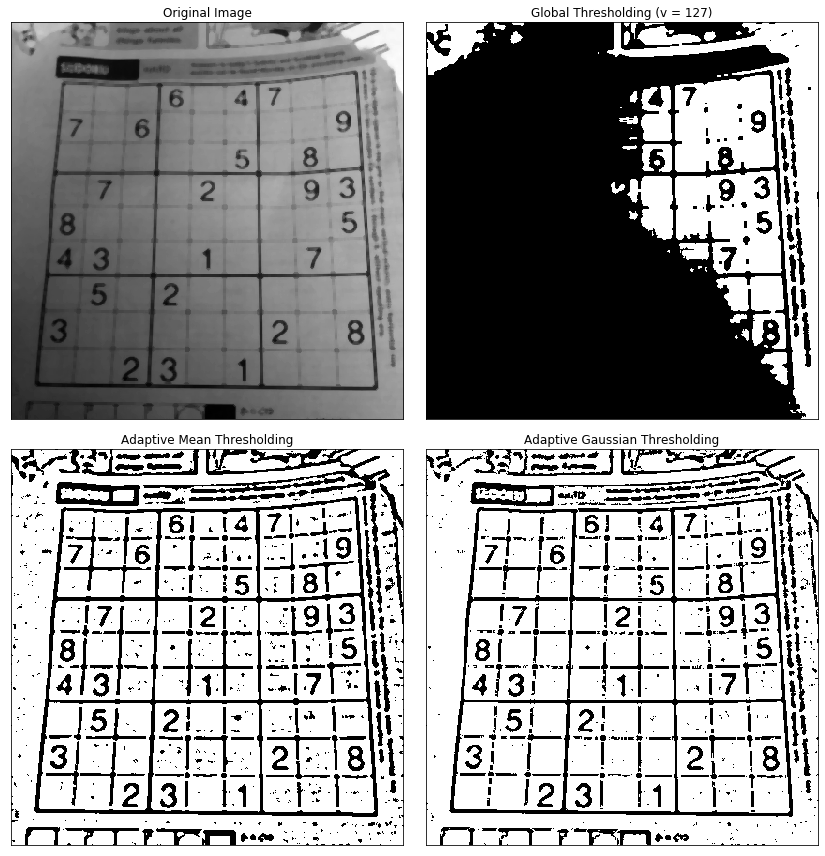

In [18]:
img = imu.load_image('./data/sudoku.jpg')
# convert
img = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
imu.show(img)
img = cv.medianBlur(img, 5)
imu.plot_thresh_comparrison(img)

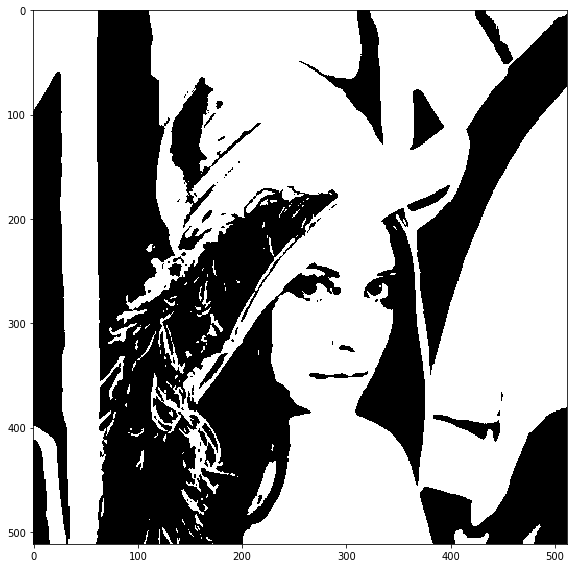

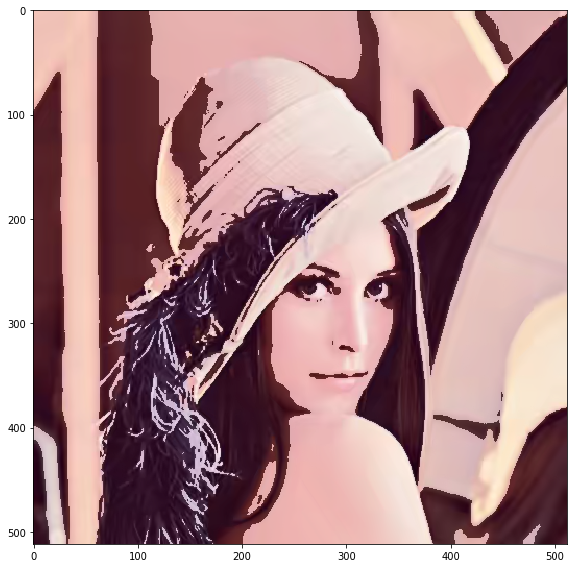

In [19]:
img = imu.load_image('./data/lena.png')
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
mask = imu.segment_otsu(gray)
imu.show(mask)
imu.show(imu.overlay_mask(img, mask))

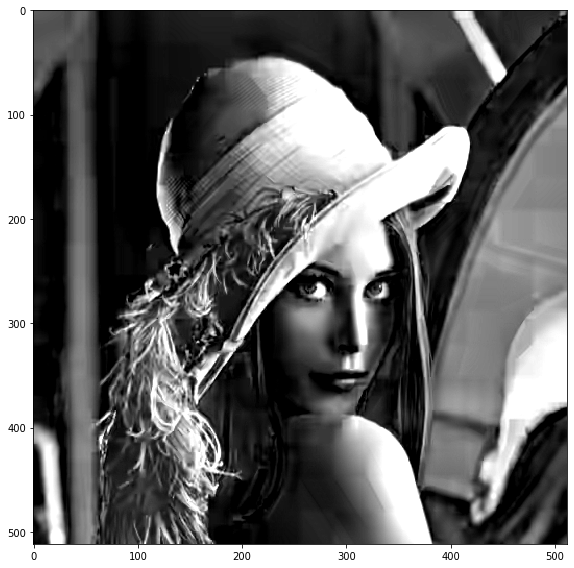

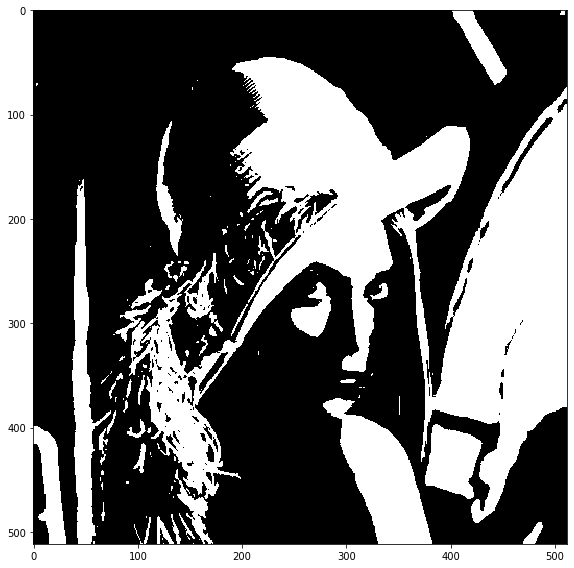

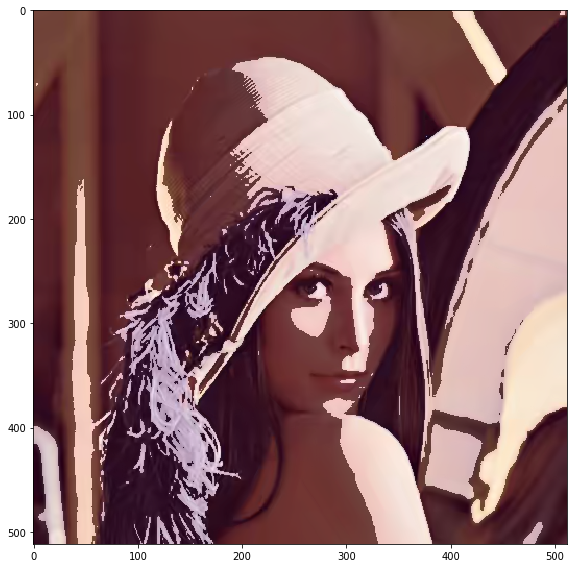

In [20]:
cgray = imu.custom_gray(img, rgb_weights=np.array([-1.4, 1.5, 1.8]))
imu.show(cgray)
mask = imu.segment_otsu(cgray)
imu.show(mask)
imu.show(imu.overlay_mask(img, mask))

# Morphology

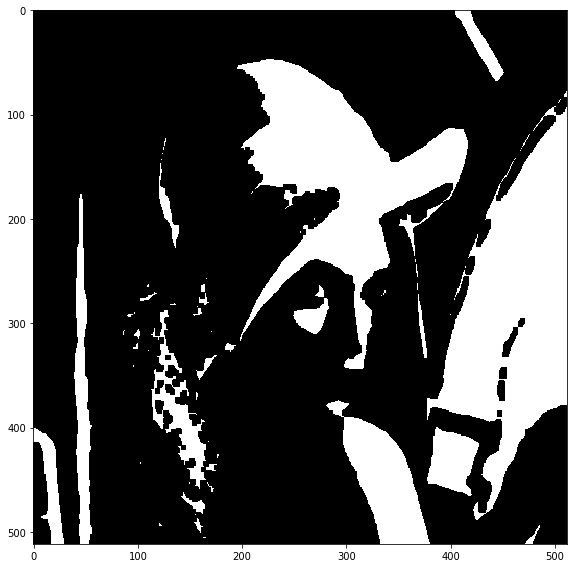

In [21]:
kernel = np.ones((5,5),np.uint8)
erosion = cv.erode(mask,kernel,iterations = 1)
imu.show(erosion)

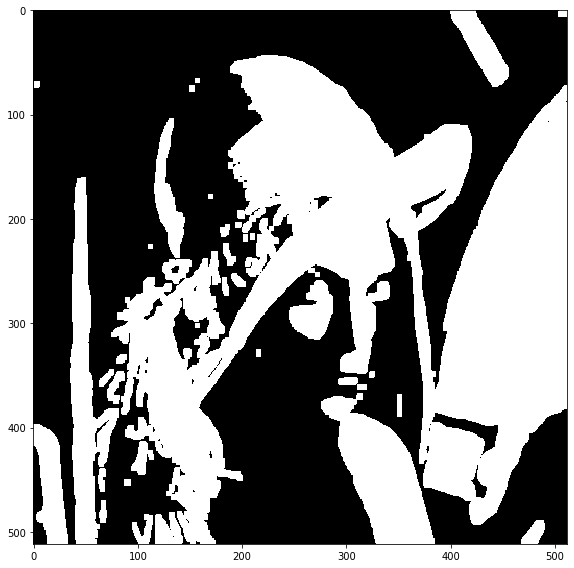

In [22]:
dilation = cv.dilate(mask,kernel,iterations = 1)
imu.show(dilation)

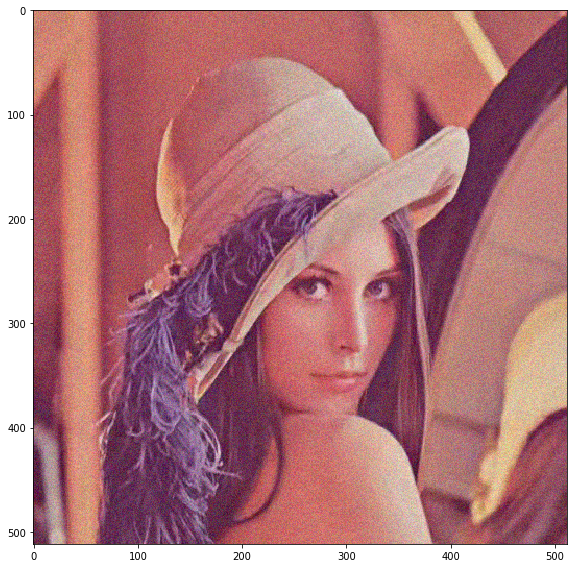

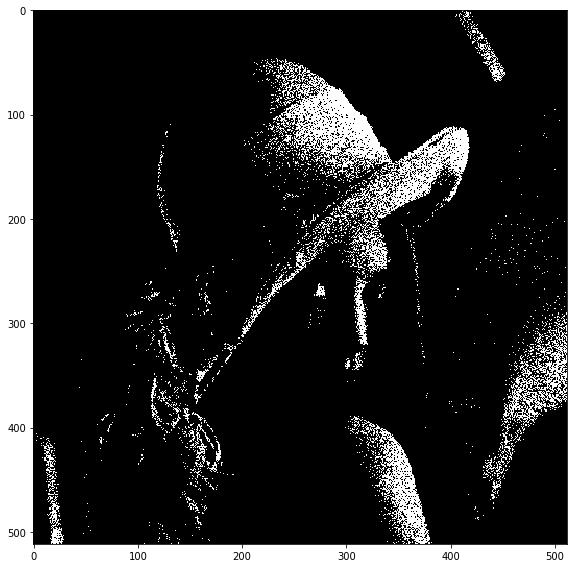

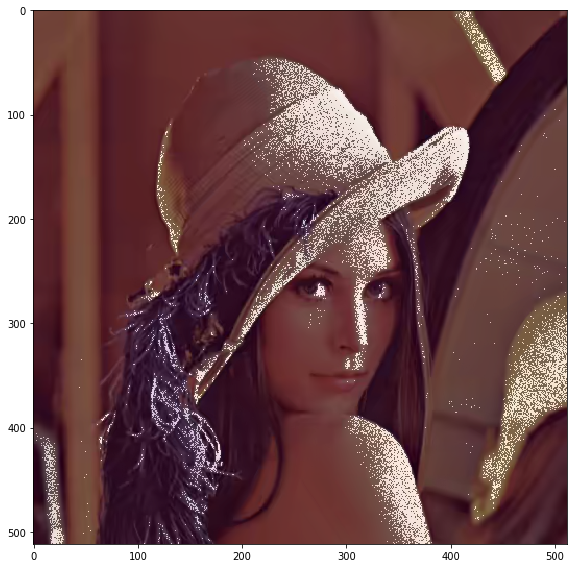

In [23]:
imu.show(noised)
cgray = imu.custom_gray(noised, rgb_weights=np.array([-1.4, 1.5, 1.8]))
mask2 = imu.segment_otsu(cgray)
imu.show(mask2)
imu.show(imu.overlay_mask(img, mask2))

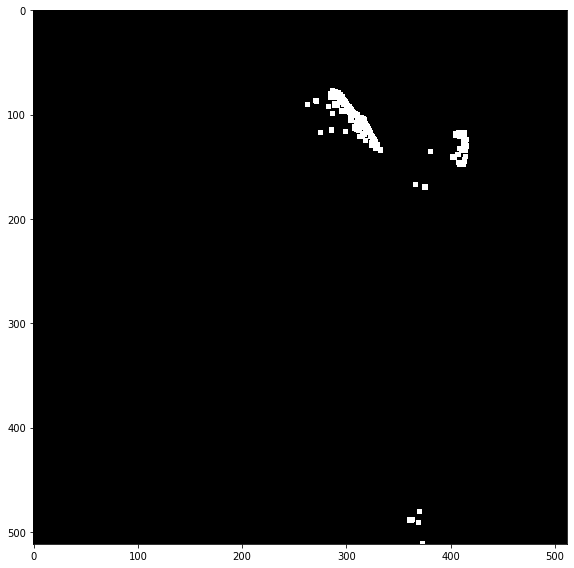

In [24]:
opening = cv.morphologyEx(mask2, cv.MORPH_OPEN, kernel)
imu.show(opening)

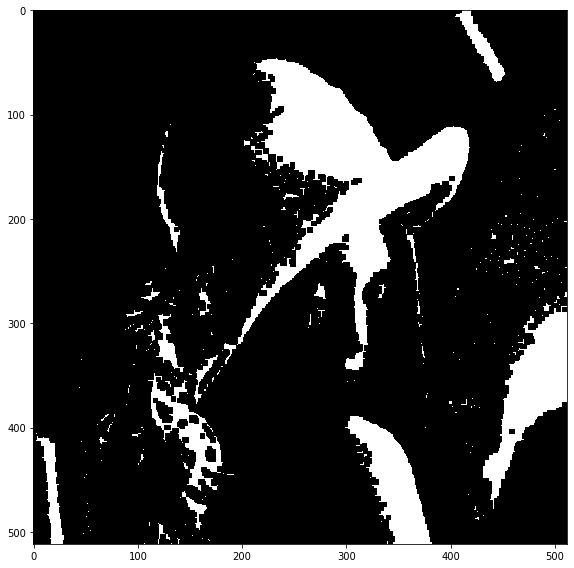

In [25]:
closing = cv.morphologyEx(mask2, cv.MORPH_CLOSE, kernel)
imu.show(closing)

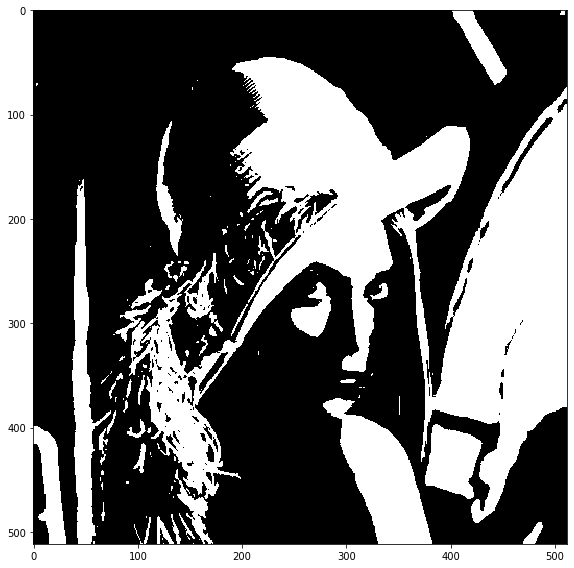

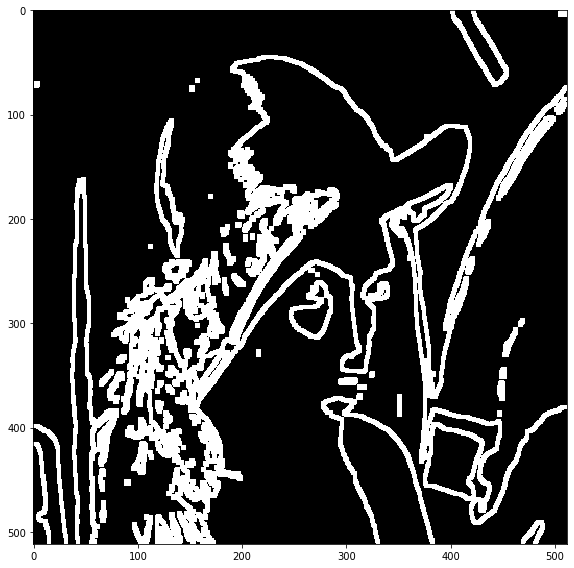

In [26]:
imu.show(mask)
gradient = cv.morphologyEx(mask, cv.MORPH_GRADIENT, kernel)
imu.show(gradient)

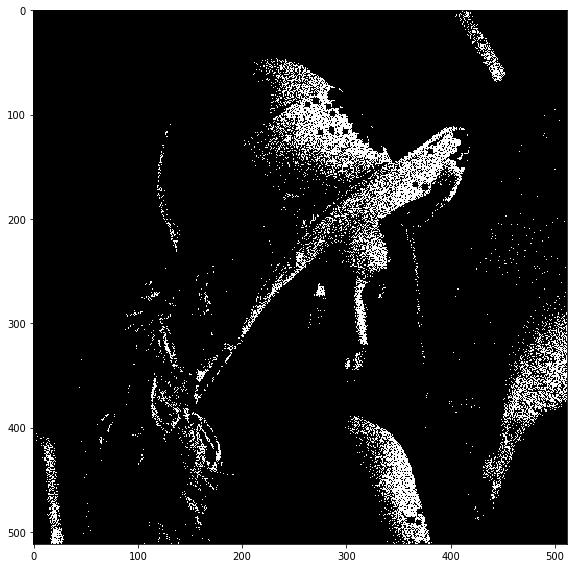

In [27]:
tophat = cv.morphologyEx(mask2, cv.MORPH_TOPHAT, kernel)
imu.show(tophat)

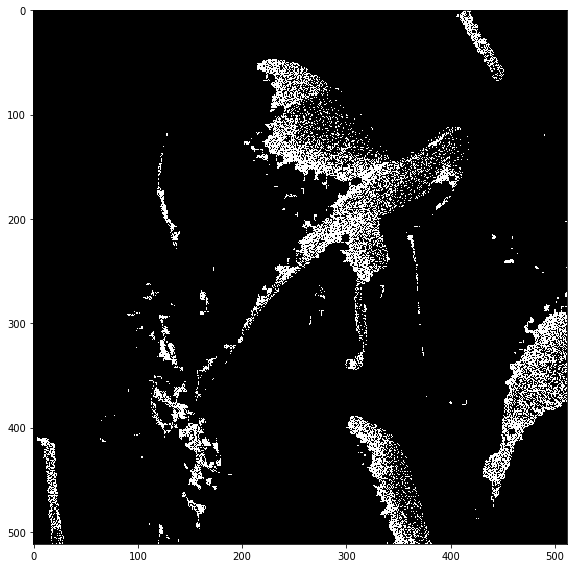

In [28]:
blackhat = cv.morphologyEx(mask2, cv.MORPH_BLACKHAT, kernel)
imu.show(blackhat)

# Template Match
    TODOs: exemplo simples de TM
    profiler para canny e com três canais
    
    exercicio: imagem escalonada de templates diferentes

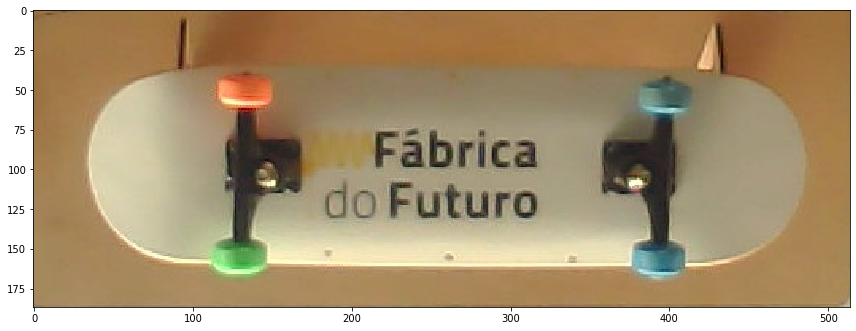

In [29]:
ff = imu.load_image("./data/ff.jpg")
imu.show(ff)

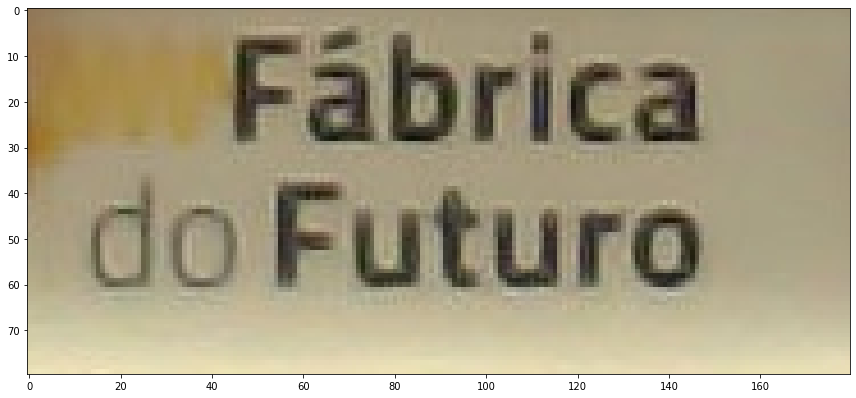

In [54]:
logo = ff[70:150, 170:350]
imu.show(logo)

In [31]:
%%timeit

cv.matchTemplate(ff, logo, cv.TM_CCOEFF_NORMED)

11 ms ± 347 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


# Some improvements to template match
In order to make faster template matches we could:
 - use it in grayscale
 - use it in binary images (Canny for example)

In [32]:
ff_gray = cv.cvtColor(ff, cv.COLOR_RGB2GRAY)
logo_gray = cv.cvtColor(logo, cv.COLOR_RGB2GRAY)

In [33]:
%%timeit

cv.matchTemplate(ff_gray, logo_gray, cv.TM_CCOEFF_NORMED)

3.96 ms ± 195 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [34]:
ff_canny = cv.Canny(ff_gray, 50, 200)
logo_canny = cv.Canny(logo_gray, 50, 200)

In [35]:
%%timeit

cv.matchTemplate(ff_canny, logo_canny, cv.TM_CCOEFF_NORMED)

3.75 ms ± 77.3 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


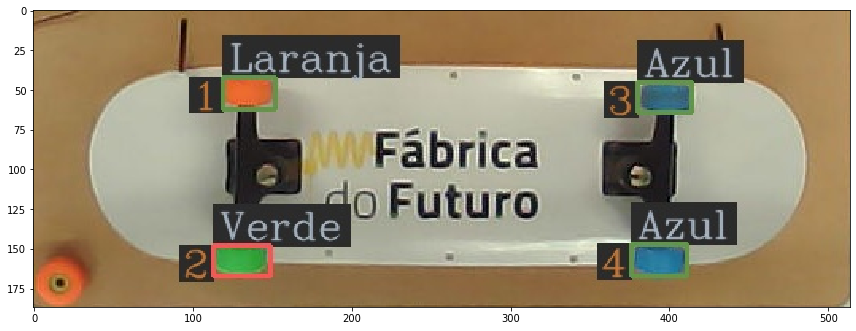

0.8418114185333252


In [36]:
ff2 = imu.load_image("./data/ff2.jpg")
ff2_gray = cv.cvtColor(ff2, cv.COLOR_RGB2GRAY)

imu.show(ff2)

res = cv.matchTemplate(ff2_gray, logo_gray, cv.TM_CCOEFF_NORMED)
(match, _, pos) = cv.minMaxLoc(res)[1:]

print(match)

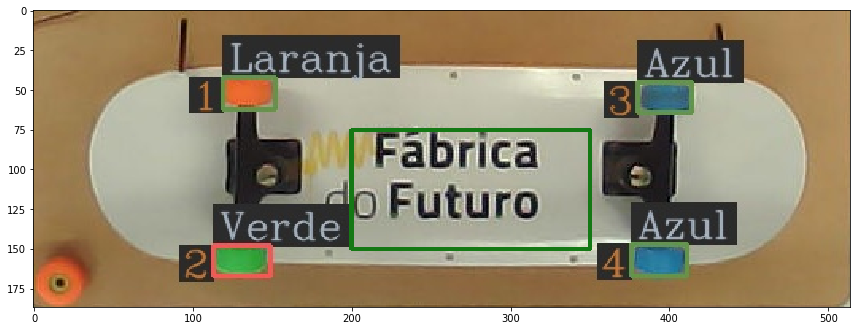

In [37]:
(tH, tW) = logo.shape[:2]

ff2_tm = np.copy(ff2)
cv.rectangle(
    ff2_tm,
    (pos[0], pos[1]),
    (pos[0] + tW, pos[1] + tH),
    (20, 120, 20),    2,)

imu.show(ff2_tm)

# Hough

# Wavelets

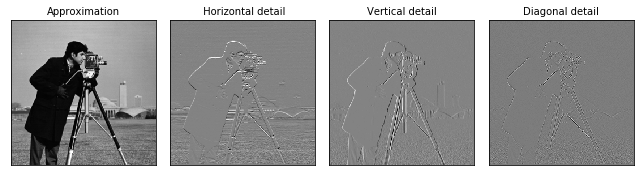

In [38]:
import numpy as np
import matplotlib.pyplot as plt

import pywt
import pywt.data


# Load image
original = pywt.data.camera()

# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
# coeffs2 = pywt.dwt2(original, 'bior1.3')
coeffs2 = pywt.dwt2(original, 'haar')

LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(9, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

# Haar basis
The example below is from EPFL digital signal processing course, it can be found on [this link](https://www.coursera.org/learn/dsp)

In [39]:
import math

def haar1D(n, SIZE):
    # check power of two
    if math.floor(math.log(SIZE) / math.log(2)) != math.log(SIZE) / math.log(2):
        print("Haar defined only for lengths that are a power of two")
        return None
    if n >= SIZE or n < 0:
        print("invalid Haar index")
        return None
    
    # zero basis vector
    if n == 0:
        return np.ones(SIZE)
    
    # express n > 1 as 2^p + q with p as large as possible;
    # then k = SIZE/2^p is the length of the support
    # and s = qk is the shift
    p = math.floor(math.log(n) / math.log(2))
    pp = int(pow(2, p))
    k = SIZE / pp
    s = (n - pp) * k
    
    h = np.zeros(SIZE)
    h[int(s):int(s+k/2)] = 1
    h[int(s+k/2):int(s+k)] = -1
    # these are not normalized
    return h


def haar2D(n, SIZE=8):
    # get horizontal and vertical indices
    hr = haar1D(n % SIZE, SIZE)
    hv = haar1D(int(n / SIZE), SIZE)
    # 2D Haar basis matrix is separable, so we can
    #  just take the column-row product
    H = np.outer(hr, hv)
    H = H / math.sqrt(np.sum(H * H))
    return H

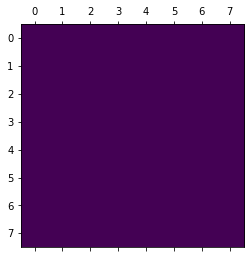

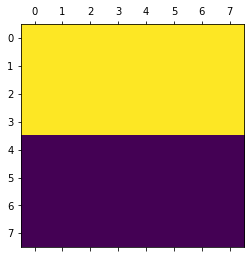

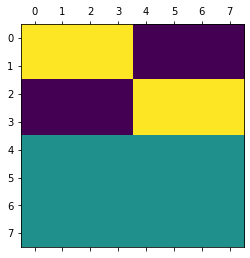

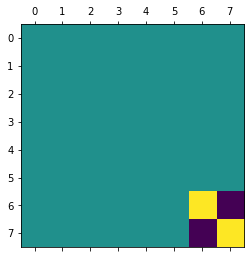

In [40]:
plt.matshow(haar2D(0));
plt.matshow(haar2D(1));
plt.matshow(haar2D(10));
plt.matshow(haar2D(63));

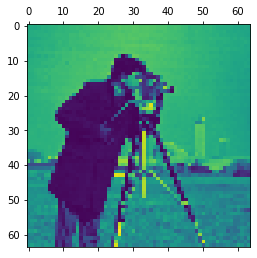

In [41]:
img = cv.resize(original, (64,64))

# project the image onto the Haar basis, obtaining a vector of 4096 coefficients
# this is simply the analysis formula for the vector space with an orthogonal basis
tx_img = np.zeros(64*64)
for k in range(0, (64*64)):
    tx_img[k] = np.sum(img * haar2D(k, 64))

# now rebuild the image with the synthesis formula; since the basis is orthonormal
#  we just need to scale the basis matrices by the projection coefficients
rx_img = np.zeros((64, 64))
for k in range(0, (64*64)):
    rx_img += tx_img[k] * haar2D(k, 64)

plt.matshow(rx_img);

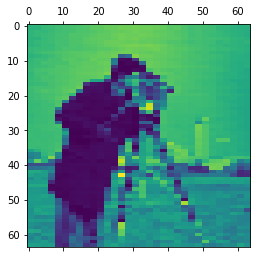

In [42]:
# oops, we lose half the data
lossy_img = np.copy(tx_img);
lossy_img[int(len(tx_img)/2):] = 0

# rebuild matrix
rx_img = np.zeros((64, 64))
for k in range(0, (64*64)):
    rx_img += lossy_img[k] * haar2D(k, 64)

plt.matshow(rx_img);

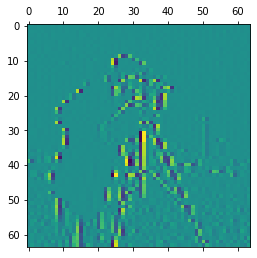

In [43]:
lossy_img = np.copy(tx_img);
lossy_img[0:int(len(tx_img)/2)] = 0

rx_img = np.zeros((64, 64))
for k in range(0, (64*64)):
    rx_img += lossy_img[k] * haar2D(k, 64)

plt.matshow(rx_img);